In [ ]:
import os
import cv2
import glob
import random
import imageio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tensorflow.keras.applications import ResNet50, InceptionV3, VGG16, VGG19, Xception, MobileNet
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Flatten, ZeroPadding2D, Conv2D, MaxPooling2D
from tensorflow.keras import Input, Model, Sequential

from sklearn import metrics
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

from keras.layers.core import Dropout

np.random.seed(123)
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# untuk menampilkan deretan gambar yang akan dilakukan klasifikasi
def plot_data(img_array, labels_array, n_samples=5):
    classes = set(labels_array)
    fig, ax = plt.subplots(len(classes), n_samples)

    for label_idx, class_label in enumerate(classes):
        data = img_array[labels_array == class_label]
        samples_from_class = random.choices(data, k=n_samples)
        for i, img in enumerate(samples_from_class):
            ax[label_idx, i].imshow(img)
            ax[label_idx, i].axis('off')

# For Transfer Learning Model (Aksara Sunda Image Classification)

In [ ]:
new_data = pd.read_csv(os.path.join('/content/drive/My Drive/TA/aksara_final/csv/aksarafinal.csv'))

# acak dataframe
new_data = shuffle(new_data, random_state = 20)
new_data.head(15)

,letter,label,nama_file
1356,eu,7,eu_157.png
6100,kha,31,kha_101.png
1277,eu,7,eu_78.png
323,ei,2,ei_124.png
3284,pa,17,pa_85.png
4831,ha,25,ha_32.png
2045,ca,11,ca_46.png
4845,ha,25,ha_46.png
3118,na,16,na_119.png
4329,la,22,la_130.png


In [ ]:
from sklearn.model_selection import train_test_split

new_train, new_test = train_test_split(new_data, test_size=0.2, random_state=5)

new_train['letter'] = new_train.letter.astype('str')
new_test['letter'] = new_test.letter.astype('str')

print(f"No. of training examples: {new_train.shape[0]}")
print(f"No. of testing examples: {new_test.shape[0]}")

No. of training examples: 5120
No. of testing examples: 1280


# Plotting dataset

In [ ]:
new_X = []
new_y = []

count = 0
for index, row in new_data.iterrows():
  if count < 64:
    img_arr = cv2.imread(os.path.join('/content/drive/My Drive/TA/aksara_final', row['nama_file']))

    # Define the new size
    new_size = (32, 32)

    # Resize the image
    resized_img = cv2.resize(img_arr, new_size)

    if resized_img.shape == (32, 32, 3):
      print(row['nama_file'])
      new_X.append(resized_img)
      new_y.append(row['label'])
    count += 1

new_X = np.array(new_X)
new_y = np.array(new_y)
new_X.shape, new_y.shape

eu_157.png
kha_101.png
eu_78.png
ei_124.png
pa_85.png
ha_32.png
ca_46.png
ha_46.png
na_119.png
la_130.png
ma_169.png
ta_136.png
ha_176.png
pa_129.png
fa_2.png
ja_54.png
wa_30.png
sya_120.png
ba_8.png
kha_23.png
pa_94.png
la_141.png
nya_63.png
a_128.png
a_146.png
sa_198.png
qa_167.png
ga_176.png
ja_112.png
u_190.png
pa_40.png
ei_54.png
kha_59.png
za_114.png
ya_138.png
nya_115.png
ma_40.png
ma_174.png
nya_56.png
ra_18.png
ka_121.png
ca_81.png
ei_196.png
za_74.png
ha_133.png
ha_97.png
e_114.png
da_94.png
kha_180.png
ka_10.png
nya_190.png
ei_84.png
va_105.png
da_107.png
nga_41.png
ca_36.png
o_55.png
ka_127.png
nya_195.png
xa_34.png
pa_76.png
ya_199.png
na_9.png
ba_152.png


((64, 32, 32, 3), (64,))

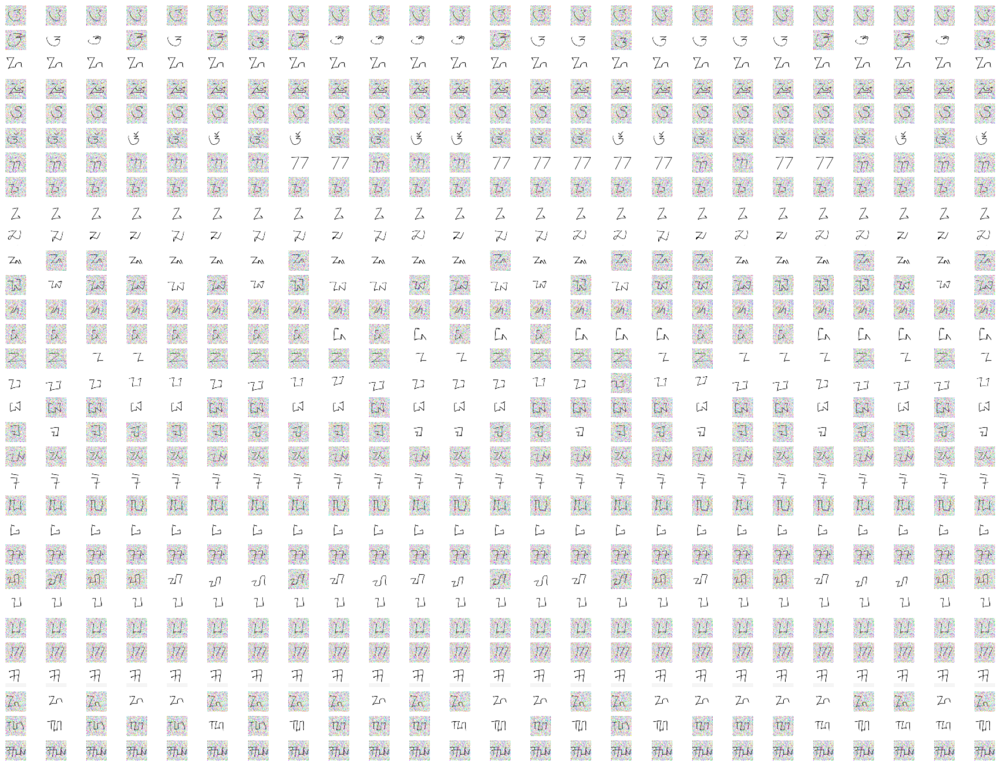

In [ ]:
plot_data(new_X, new_y, n_samples=25)
plt.subplots_adjust(right=3, top=3)

In [ ]:
new_dataset_path = '/content/drive/My Drive/TA/aksara_final'

# Create the ImageDataGenerator object
new_datagenerator = ImageDataGenerator(
    # rescale=1/255,
    # featurewise_center=True,
    # featurewise_std_normalization=True,
    # rotation_range=20,
    # width_shift_range=0.2,
    # height_shift_range=0.2,
    # horizontal_flip=True,
)

# Generate batches and augment the images
new_train_generator = new_datagenerator.flow_from_dataframe(
    new_train,
    directory=new_dataset_path,
    x_col='nama_file',
    y_col='letter',
    class_mode='categorical',
    target_size=(224, 224),
)

new_val_generator = new_datagenerator.flow_from_dataframe(
    new_test,
    directory=new_dataset_path,
    x_col='nama_file',
    y_col='letter',
    class_mode='categorical',
    target_size=(224, 224),
)

Found 5120 validated image filenames belonging to 32 classes.
Found 1280 validated image filenames belonging to 32 classes.


# Resnet Arsitektur

In [ ]:
from keras import metrics

# set input shape and output class untuk image
resnet_input_shape = (224, 224, 3)
resnet_output_class = 32

# set pre-trained model untuk dilakukan transfer learning
resnet_feature_extractor = ResNet50(weights='imagenet',
                              input_shape=resnet_input_shape,
                              include_top=False)

# set parameter agar weight pada model tidak dilakukan train ulang
resnet_feature_extractor.trainable = False

# set input layer
resnet_input_ = Input(shape=resnet_input_shape)

# set feature extractor layer
x = resnet_feature_extractor(resnet_input_, training=False)

# set pooling layer
x = GlobalAveragePooling2D()(x)

# set final layer (output) softmax activation function
resnet_output_ = Dense(resnet_output_class, activation='softmax')(x)

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
import tensorflow as tf
from sklearn.metrics import precision_score, recall_score, f1_score
from tensorflow.keras import backend as K

# Define a custom metric class for F1-Score
def F1Score(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
# Compile the model with custom metric
resnet_model_glbl = Model(resnet_input_, resnet_output_)
resnet_model_glbl.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=['accuracy',
                              metrics.Precision(name='precision'),
                              metrics.Recall(name='recall'),
                              F1Score])
resnet_model_glbl.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 32)                65568     
                                                                 
Total params: 23,653,280
Trainable params: 65,568
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
resnet_history_glbl = resnet_model_glbl.fit(new_train_generator, epochs=20, validation_data=new_val_generator)

Epoch 1/20
160/160 [==============================] - 2352s 15s/step - loss: 2.7019 - accuracy: 0.2918 - precision: 0.9491 - recall: 0.0400 - F1Score: 0.0723 - val_loss: 2.0725 - val_accuracy: 0.4906 - val_precision: 0.9578 - val_recall: 0.1242 - val_F1Score: 0.2148
Epoch 2/20
160/160 [==============================] - 15s 96ms/step - loss: 1.8166 - accuracy: 0.5395 - precision: 0.9698 - recall: 0.2010 - F1Score: 0.3267 - val_loss: 1.6639 - val_accuracy: 0.5758 - val_precision: 0.9688 - val_recall: 0.2664 - val_F1Score: 0.4110
Epoch 3/20
160/160 [==============================] - 15s 91ms/step - loss: 1.4943 - accuracy: 0.6301 - precision: 0.9718 - recall: 0.3234 - F1Score: 0.4790 - val_loss: 1.4959 - val_accuracy: 0.5844 - val_precision: 0.9577 - val_recall: 0.3359 - val_F1Score: 0.4933
Epoch 4/20
160/160 [==============================] - 15s 91ms/step - loss: 1.3023 - accuracy: 0.6754 - precision: 0.9628 - recall: 0.4045 - F1Score: 0.5636 - val_loss: 1.3128 - val_accuracy: 0.6648 - 

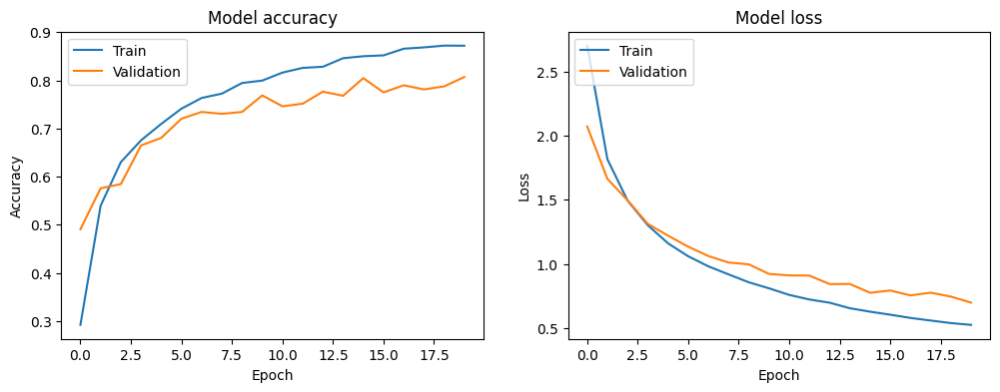

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(resnet_history_glbl.history['accuracy'])
plt.plot(resnet_history_glbl.history['val_accuracy'])
plt.title('Model accuracy')

plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(resnet_history_glbl.history['loss'])
plt.plot(resnet_history_glbl.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

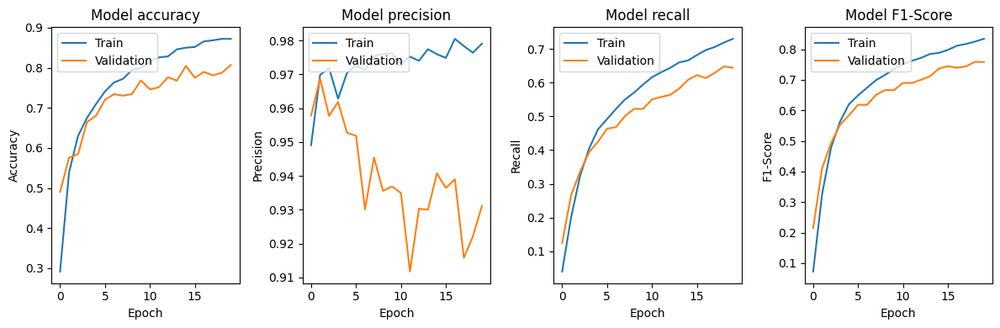

In [ ]:
# Plot training & validation accuracy, precision, and recall values
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(resnet_history_glbl.history['accuracy'])
plt.plot(resnet_history_glbl.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 2)
plt.plot(resnet_history_glbl.history['precision'])
plt.plot(resnet_history_glbl.history['val_precision'])
plt.title('Model precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 3)
plt.plot(resnet_history_glbl.history['recall'])
plt.plot(resnet_history_glbl.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 4)
plt.plot(resnet_history_glbl.history['F1Score'])
plt.plot(resnet_history_glbl.history['val_F1Score'])
plt.title('Model F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
from keras import metrics

# set input shape and output class for the image
resnet_input_shape = (224, 224, 3)
resnet_output_class = 32

# set pre-trained model for transfer learning
resnet_feature_extractor = ResNet50(weights='imagenet',
                                    input_shape=resnet_input_shape,
                                    include_top=False)

# set parameter to freeze the weights of the pre-trained model
resnet_feature_extractor.trainable = False

# set input layer
resnet_input_ = Input(shape=resnet_input_shape)

# set feature extractor layer
x = resnet_feature_extractor(resnet_input_, training=False)

# flatten the output of the feature extractor
x = Flatten()(x)

# set final layer (output) with softmax activation function
resnet_output_ = Dense(resnet_output_class, activation='softmax')(x)

In [ ]:
# Compile the model with custom metric
resnet_model_fltn = Model(resnet_input_, resnet_output_)
resnet_model_fltn.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=['accuracy',
                              metrics.Precision(name='precision'),
                              metrics.Recall(name='recall'),
                              F1Score])
resnet_model_fltn.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense_1 (Dense)             (None, 32)                3211296   
                                                                 
Total params: 26,799,008
Trainable params: 3,211,296
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
resnet_history_fltn = resnet_model_fltn.fit(new_train_generator, epochs=20, validation_data=new_val_generator)

Epoch 1/20
160/160 [==============================] - 20s 99ms/step - loss: 8.5645 - accuracy: 0.5398 - precision: 0.5558 - recall: 0.5334 - F1Score: 0.5424 - val_loss: 3.9347 - val_accuracy: 0.7133 - val_precision: 0.7215 - val_recall: 0.7063 - val_F1Score: 0.7136
Epoch 2/20
160/160 [==============================] - 15s 94ms/step - loss: 1.8645 - accuracy: 0.8092 - precision: 0.8176 - recall: 0.8072 - F1Score: 0.8122 - val_loss: 5.3010 - val_accuracy: 0.6453 - val_precision: 0.6489 - val_recall: 0.6453 - val_F1Score: 0.6472
Epoch 3/20
160/160 [==============================] - 16s 97ms/step - loss: 1.4846 - accuracy: 0.8572 - precision: 0.8622 - recall: 0.8557 - F1Score: 0.8589 - val_loss: 2.9936 - val_accuracy: 0.7703 - val_precision: 0.7773 - val_recall: 0.7664 - val_F1Score: 0.7715
Epoch 4/20
160/160 [==============================] - 16s 98ms/step - loss: 0.7299 - accuracy: 0.9150 - precision: 0.9178 - recall: 0.9139 - F1Score: 0.9158 - val_loss: 3.6848 - val_accuracy: 0.7211 - v

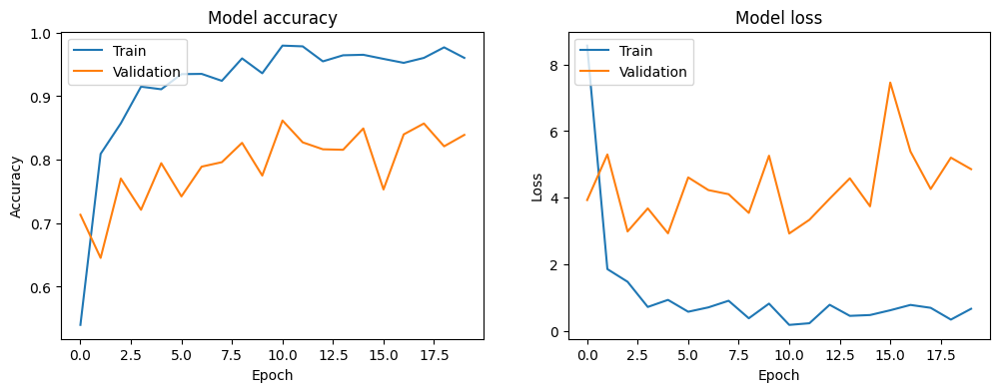

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(resnet_history_fltn.history['accuracy'])
plt.plot(resnet_history_fltn.history['val_accuracy'])
plt.title('Model accuracy')

plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(resnet_history_fltn.history['loss'])
plt.plot(resnet_history_fltn.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

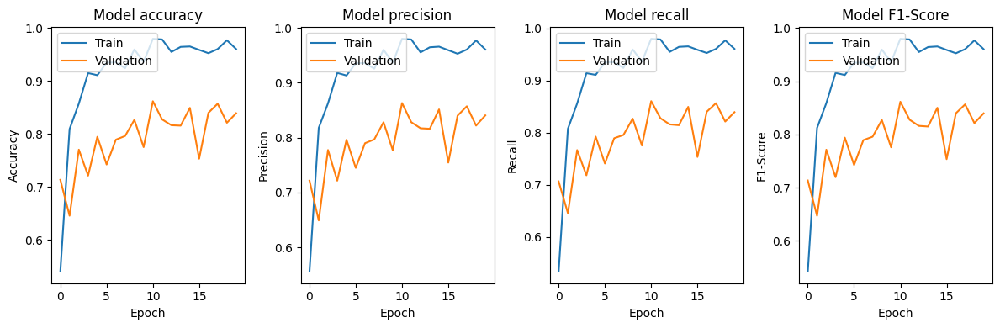

In [ ]:
# Plot training & validation accuracy, precision, and recall values
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(resnet_history_fltn.history['accuracy'])
plt.plot(resnet_history_fltn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 2)
plt.plot(resnet_history_fltn.history['precision'])
plt.plot(resnet_history_fltn.history['val_precision'])
plt.title('Model precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 3)
plt.plot(resnet_history_fltn.history['recall'])
plt.plot(resnet_history_fltn.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 4)
plt.plot(resnet_history_fltn.history['F1Score'])
plt.plot(resnet_history_fltn.history['val_F1Score'])
plt.title('Model F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

# VGG16 Arsitektur

In [ ]:
from keras import metrics

# set input shape and output class untuk image
vgg19_input_shape = (224, 224, 3)
vgg19_output_class = 32

# set pre-trained model untuk dilakukan transfer learning
vgg19_feature_extractor = VGG19(weights='imagenet',
                              input_shape=vgg19_input_shape,
                              include_top=False)

# set parameter agar weight pada model tidak dilakukan train ulang
vgg19_feature_extractor.trainable = False

# set input layer
vgg19_input_ = Input(shape=vgg19_input_shape)

# set feature extractor layer
x = vgg19_feature_extractor(vgg19_input_, training=False)

# set pooling layer
x = GlobalAveragePooling2D()(x)

# set final layer (output) softmax activation function
vgg19_output_ = Dense(vgg19_output_class, activation='softmax')(x)

80134624/80134624 [==============================] - 1s 0us/step


In [ ]:
# Compile the model with custom metric
vgg19_model_glbl = Model(vgg19_input_, vgg19_output_)
vgg19_model_glbl.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=['accuracy',
                              metrics.Precision(name='precision'),
                              metrics.Recall(name='recall'),
                              F1Score])
vgg19_model_glbl.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d_1   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 32)                16416     
                                                                 
Total params: 20,040,800
Trainable params: 16,416
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
vgg19_history_glbl = vgg19_model_glbl.fit(new_train_generator, epochs=20, validation_data=new_val_generator)

Epoch 1/20
160/160 [==============================] - 18s 95ms/step - loss: 3.6807 - accuracy: 0.2676 - precision: 0.4070 - recall: 0.1791 - F1Score: 0.2448 - val_loss: 1.7983 - val_accuracy: 0.4906 - val_precision: 0.6785 - val_recall: 0.3727 - val_F1Score: 0.4780
Epoch 2/20
160/160 [==============================] - 15s 96ms/step - loss: 1.2140 - accuracy: 0.6383 - precision: 0.7846 - recall: 0.5172 - F1Score: 0.6199 - val_loss: 1.0832 - val_accuracy: 0.6648 - val_precision: 0.7864 - val_recall: 0.5695 - val_F1Score: 0.6578
Epoch 3/20
160/160 [==============================] - 15s 93ms/step - loss: 0.7707 - accuracy: 0.7672 - precision: 0.8681 - recall: 0.6801 - F1Score: 0.7611 - val_loss: 0.8198 - val_accuracy: 0.7586 - val_precision: 0.8491 - val_recall: 0.6859 - val_F1Score: 0.7581
Epoch 4/20
160/160 [==============================] - 15s 92ms/step - loss: 0.5604 - accuracy: 0.8313 - precision: 0.9064 - recall: 0.7580 - F1Score: 0.8240 - val_loss: 0.6970 - val_accuracy: 0.7891 - v

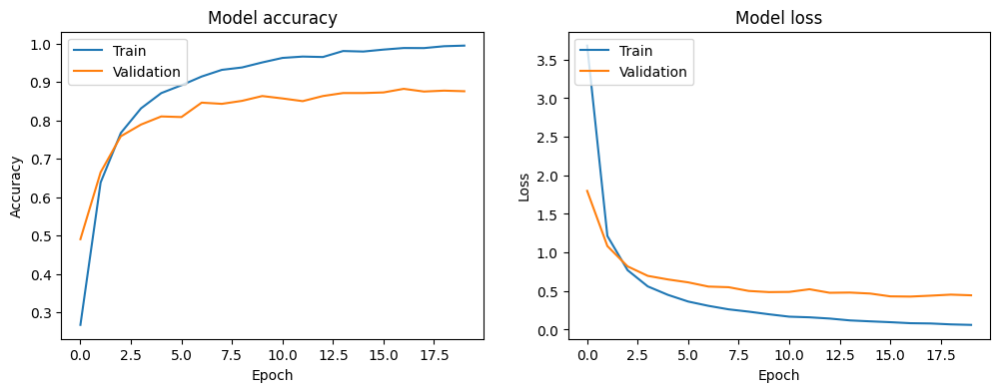

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(vgg19_history_glbl.history['accuracy'])
plt.plot(vgg19_history_glbl.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(vgg19_history_glbl.history['loss'])
plt.plot(vgg19_history_glbl.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

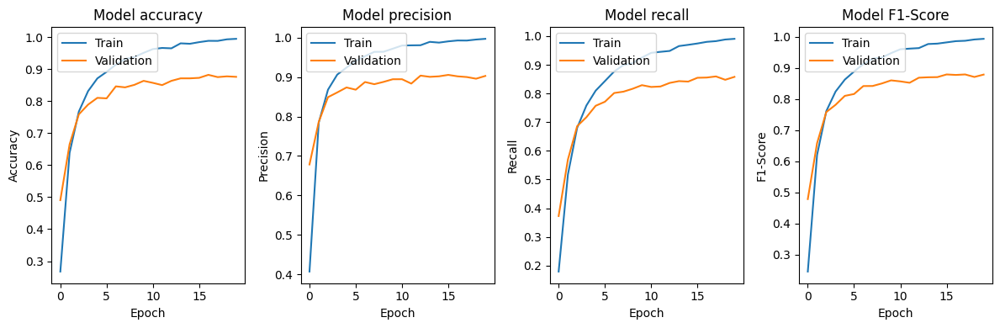

In [ ]:
# Plot training & validation accuracy, precision, and recall values
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(vgg19_history_glbl.history['accuracy'])
plt.plot(vgg19_history_glbl.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 2)
plt.plot(vgg19_history_glbl.history['precision'])
plt.plot(vgg19_history_glbl.history['val_precision'])
plt.title('Model precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 3)
plt.plot(vgg19_history_glbl.history['recall'])
plt.plot(vgg19_history_glbl.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 4)
plt.plot(vgg19_history_glbl.history['F1Score'])
plt.plot(vgg19_history_glbl.history['val_F1Score'])
plt.title('Model F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
from keras import metrics

# set input shape and output class untuk image
vgg19_input_shape = (224, 224, 3)
vgg19_output_class = 32

# set pre-trained model untuk dilakukan transfer learning
vgg19_feature_extractor = VGG19(weights='imagenet',
                              input_shape=vgg19_input_shape,
                              include_top=False)

# set parameter agar weight pada model tidak dilakukan train ulang
vgg19_feature_extractor.trainable = False

# set input layer
vgg19_input_ = Input(shape=vgg19_input_shape)

# set feature extractor layer
x = vgg19_feature_extractor(vgg19_input_, training=False)

# flatten the output of the feature extractor
x = Flatten()(x)

# set final layer (output) softmax activation function
vgg19_output_ = Dense(vgg19_output_class, activation='softmax')(x)

In [ ]:
# Compile the model with custom metric
vgg19_model_fltn = Model(vgg19_input_, vgg19_output_)
vgg19_model_fltn.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=['accuracy',
                              metrics.Precision(name='precision'),
                              metrics.Recall(name='recall'),
                              F1Score])
vgg19_model_fltn.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_3 (Dense)             (None, 32)                802848    
                                                                 
Total params: 20,827,232
Trainable params: 802,848
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
vgg19_history_fltn = vgg19_model_fltn.fit(new_train_generator, epochs=20, validation_data=new_val_generator)

Epoch 1/20
160/160 [==============================] - 16s 95ms/step - loss: 9.7235 - accuracy: 0.7045 - precision: 0.7052 - recall: 0.7041 - F1Score: 0.7045 - val_loss: 5.8574 - val_accuracy: 0.8336 - val_precision: 0.8342 - val_recall: 0.8336 - val_F1Score: 0.8339
Epoch 2/20
160/160 [==============================] - 15s 93ms/step - loss: 2.1339 - accuracy: 0.9152 - precision: 0.9158 - recall: 0.9150 - F1Score: 0.9154 - val_loss: 5.5575 - val_accuracy: 0.8375 - val_precision: 0.8375 - val_recall: 0.8375 - val_F1Score: 0.8375
Epoch 3/20
160/160 [==============================] - 15s 92ms/step - loss: 1.0310 - accuracy: 0.9531 - precision: 0.9531 - recall: 0.9531 - F1Score: 0.9531 - val_loss: 4.4301 - val_accuracy: 0.8773 - val_precision: 0.8773 - val_recall: 0.8773 - val_F1Score: 0.8773
Epoch 4/20
160/160 [==============================] - 14s 90ms/step - loss: 0.9864 - accuracy: 0.9637 - precision: 0.9637 - recall: 0.9637 - F1Score: 0.9637 - val_loss: 4.2312 - val_accuracy: 0.8914 - v

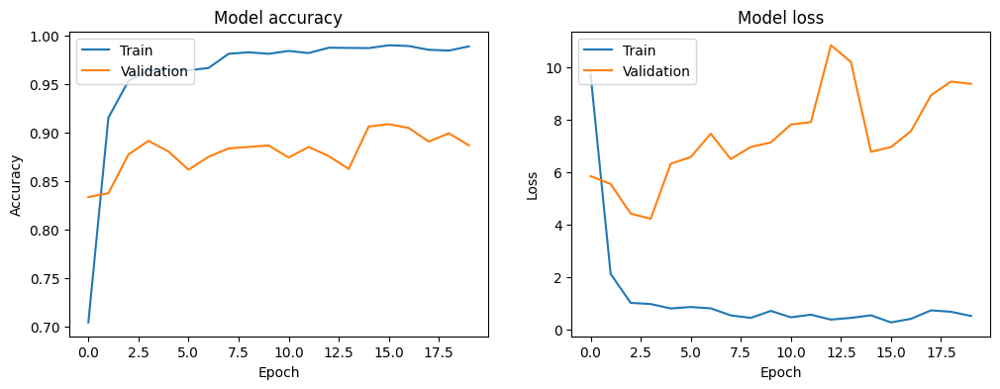

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(vgg19_history_fltn.history['accuracy'])
plt.plot(vgg19_history_fltn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(vgg19_history_fltn.history['loss'])
plt.plot(vgg19_history_fltn.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

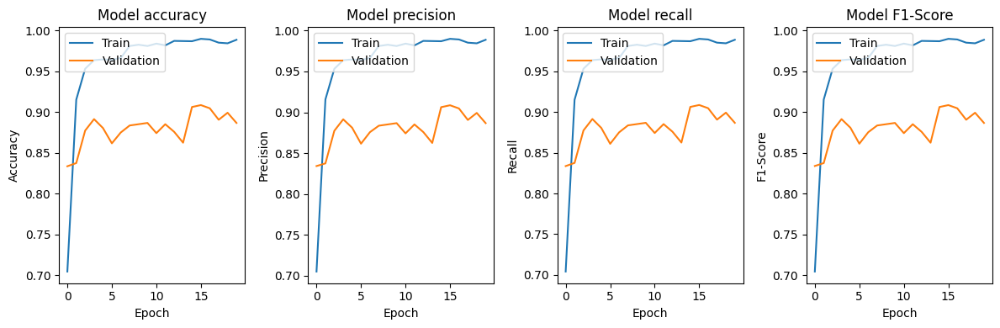

In [ ]:
# Plot training & validation accuracy, precision, and recall values
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(vgg19_history_fltn.history['accuracy'])
plt.plot(vgg19_history_fltn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 2)
plt.plot(vgg19_history_fltn.history['precision'])
plt.plot(vgg19_history_fltn.history['val_precision'])
plt.title('Model precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 3)
plt.plot(vgg19_history_fltn.history['recall'])
plt.plot(vgg19_history_fltn.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 4)
plt.plot(vgg19_history_fltn.history['F1Score'])
plt.plot(vgg19_history_fltn.history['val_F1Score'])
plt.title('Model F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

# MobileNet Arsitektur

In [ ]:
from keras import metrics

# set input shape and output class untuk image
mobile_input_shape = (224, 224, 3)
mobile_output_class = 32

# set pre-trained model untuk dilakukan transfer learning
mobile_feature_extractor = MobileNet(weights='imagenet',
                              input_shape=mobile_input_shape,
                              include_top=False)

# set parameter agar weight pada model tidak dilakukan train ulang
mobile_feature_extractor.trainable = False

# set input layer
mobile_input_ = Input(shape=mobile_input_shape)

# set feature extractor layer
x = mobile_feature_extractor(mobile_input_, training=False)

# set pooling layer
x = GlobalAveragePooling2D()(x)

# set final layer (output) softmax activation function
mobile_output_ = Dense(mobile_output_class, activation='softmax')(x)

17225924/17225924 [==============================] - 0s 0us/step


In [ ]:
# Compile the model with custom metric
mobile_model_glbl = Model(mobile_input_, mobile_output_)
mobile_model_glbl.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=['accuracy',
                              metrics.Precision(name='precision'),
                              metrics.Recall(name='recall'),
                              F1Score])
mobile_model_glbl.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                                 
 global_average_pooling2d_2   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_4 (Dense)             (None, 32)                32800     
                                                                 
Total params: 3,261,664
Trainable params: 32,800
Non-trainable params: 3,228,864
_________________________________________________________________


In [ ]:
mobile_history_glbl = mobile_model_glbl.fit(new_train_generator, epochs=20, validation_data=new_val_generator)

Epoch 1/20
160/160 [==============================] - 17s 91ms/step - loss: 2.8311 - accuracy: 0.2645 - precision: 0.9378 - recall: 0.0412 - F1Score: 0.0737 - val_loss: 2.3572 - val_accuracy: 0.3844 - val_precision: 0.9708 - val_recall: 0.1297 - val_F1Score: 0.2242
Epoch 2/20
160/160 [==============================] - 14s 88ms/step - loss: 2.1365 - accuracy: 0.4543 - precision: 0.9630 - recall: 0.2545 - F1Score: 0.3934 - val_loss: 2.0955 - val_accuracy: 0.4477 - val_precision: 0.9357 - val_recall: 0.3070 - val_F1Score: 0.4582
Epoch 3/20
160/160 [==============================] - 15s 91ms/step - loss: 1.9482 - accuracy: 0.4912 - precision: 0.9610 - recall: 0.3756 - F1Score: 0.5346 - val_loss: 1.9984 - val_accuracy: 0.4586 - val_precision: 0.9530 - val_recall: 0.3641 - val_F1Score: 0.5232
Epoch 4/20
160/160 [==============================] - 15s 91ms/step - loss: 1.8482 - accuracy: 0.5090 - precision: 0.9711 - recall: 0.4195 - F1Score: 0.5812 - val_loss: 1.9143 - val_accuracy: 0.4945 - v

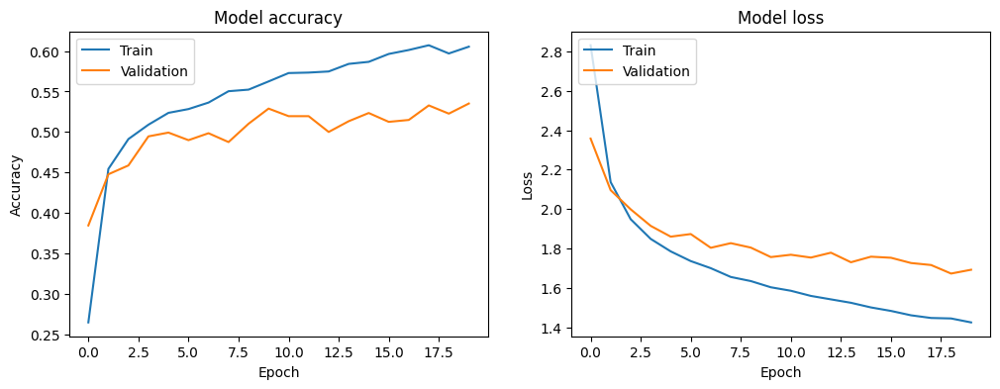

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(mobile_history_glbl.history['accuracy'])
plt.plot(mobile_history_glbl.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(mobile_history_glbl.history['loss'])
plt.plot(mobile_history_glbl.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

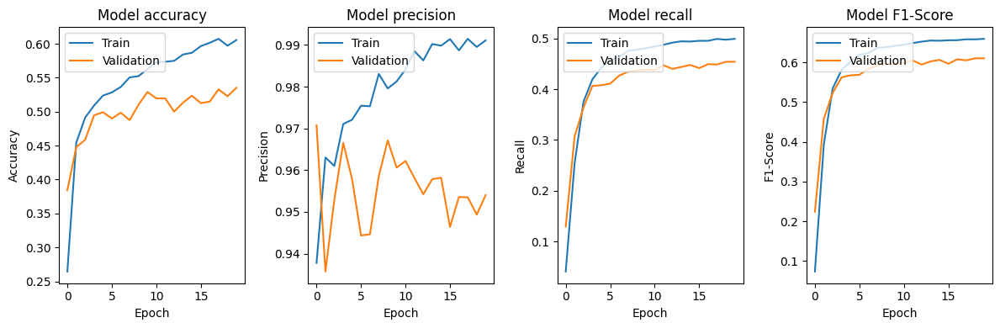

In [ ]:
# Plot training & validation accuracy, precision, and recall values
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(mobile_history_glbl.history['accuracy'])
plt.plot(mobile_history_glbl.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 2)
plt.plot(mobile_history_glbl.history['precision'])
plt.plot(mobile_history_glbl.history['val_precision'])
plt.title('Model precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 3)
plt.plot(mobile_history_glbl.history['recall'])
plt.plot(mobile_history_glbl.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 4)
plt.plot(mobile_history_glbl.history['F1Score'])
plt.plot(mobile_history_glbl.history['val_F1Score'])
plt.title('Model F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
from keras import metrics

# set input shape and output class untuk image
mobile_input_shape = (224, 224, 3)
mobile_output_class = 32

# set pre-trained model untuk dilakukan transfer learning
mobile_feature_extractor = MobileNet(weights='imagenet',
                              input_shape=mobile_input_shape,
                              include_top=False)

# set parameter agar weight pada model tidak dilakukan train ulang
mobile_feature_extractor.trainable = False

# set input layer
mobile_input_ = Input(shape=mobile_input_shape)

# set feature extractor layer
x = mobile_feature_extractor(mobile_input_, training=False)

# set pooling layer
x = Flatten()(x)

# set final layer (output) softmax activation function
mobile_output_ = Dense(mobile_output_class, activation='softmax')(x)

In [ ]:
# Compile the model with custom metric
mobile_model_fltn = Model(mobile_input_, mobile_output_)
mobile_model_fltn.compile(optimizer='adam',
                     loss='categorical_crossentropy',
                     metrics=['accuracy',
                              metrics.Precision(name='precision'),
                              metrics.Recall(name='recall'),
                              F1Score])
mobile_model_fltn.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 mobilenet_1.00_224 (Functio  (None, 7, 7, 1024)       3228864   
 nal)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 50176)             0         
                                                                 
 dense_5 (Dense)             (None, 32)                1605664   
                                                                 
Total params: 4,834,528
Trainable params: 1,605,664
Non-trainable params: 3,228,864
_________________________________________________________________


In [ ]:
mobile_history_fltn = mobile_model_fltn.fit(new_train_generator, epochs=20, validation_data=new_val_generator)

Epoch 1/20
160/160 [==============================] - 17s 94ms/step - loss: 9.1157 - accuracy: 0.3994 - precision: 0.4710 - recall: 0.3879 - F1Score: 0.4276 - val_loss: 6.4259 - val_accuracy: 0.4703 - val_precision: 0.4906 - val_recall: 0.4672 - val_F1Score: 0.4785
Epoch 2/20
160/160 [==============================] - 14s 90ms/step - loss: 4.0296 - accuracy: 0.5840 - precision: 0.6544 - recall: 0.5684 - F1Score: 0.6078 - val_loss: 5.7569 - val_accuracy: 0.5039 - val_precision: 0.5644 - val_recall: 0.4961 - val_F1Score: 0.5272
Epoch 3/20
160/160 [==============================] - 15s 91ms/step - loss: 2.9401 - accuracy: 0.6596 - precision: 0.7118 - recall: 0.6469 - F1Score: 0.6775 - val_loss: 5.2560 - val_accuracy: 0.5008 - val_precision: 0.5587 - val_recall: 0.4945 - val_F1Score: 0.5242
Epoch 4/20
160/160 [==============================] - 15s 91ms/step - loss: 2.3674 - accuracy: 0.7223 - precision: 0.7600 - recall: 0.7119 - F1Score: 0.7349 - val_loss: 5.9393 - val_accuracy: 0.5258 - v

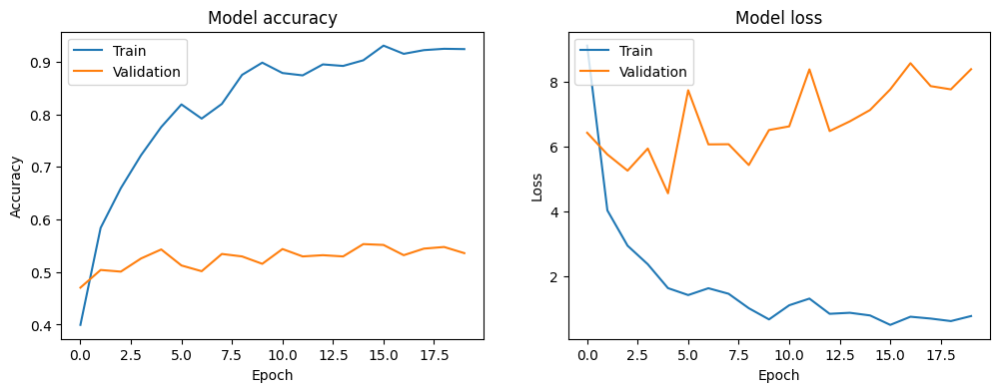

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(mobile_history_fltn.history['accuracy'])
plt.plot(mobile_history_fltn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(mobile_history_fltn.history['loss'])
plt.plot(mobile_history_fltn.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

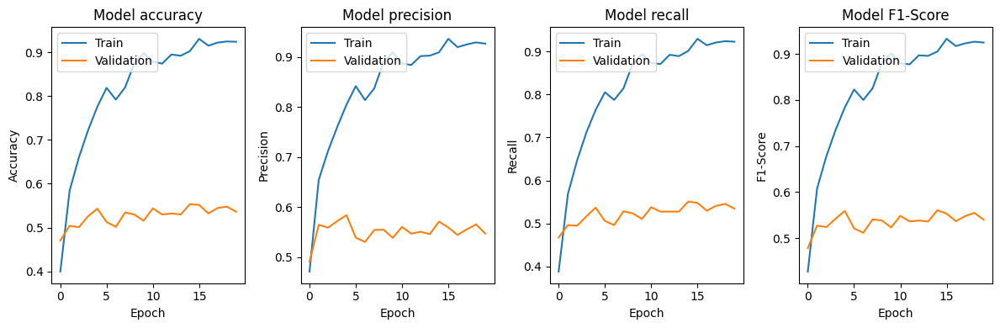

In [ ]:
# Plot training & validation accuracy, precision, and recall values
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.plot(mobile_history_fltn.history['accuracy'])
plt.plot(mobile_history_fltn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 2)
plt.plot(mobile_history_fltn.history['precision'])
plt.plot(mobile_history_fltn.history['val_precision'])
plt.title('Model precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 3)
plt.plot(mobile_history_fltn.history['recall'])
plt.plot(mobile_history_fltn.history['val_recall'])
plt.title('Model recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.subplot(1, 4, 4)
plt.plot(mobile_history_fltn.history['F1Score'])
plt.plot(mobile_history_fltn.history['val_F1Score'])
plt.title('Model F1-Score')
plt.ylabel('F1-Score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

# Prediction 3 Arsitecture Model

In [ ]:
# sample for testing model 3 arsitektur model
random_value = new_test.sample(n=32)

1/1 [==============================] - 0s 44ms/step


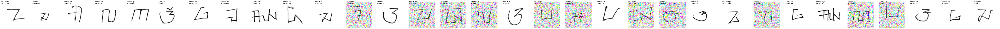

In [ ]:
# Predict with ResNet50 Model Arsitecture
img_path = '..//content/drive/MyDrive/TA/aksara_final/'

fig, ax = plt.subplots(nrows=1, ncols=32, figsize=(120,32))

for index, val in enumerate(random_value.values):
  img = load_img(img_path + val[2], target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  class_indices = new_train_generator.class_indices
  index_to_class = {v: k for k, v in class_indices.items()}

  # load the model
  resnet_prediction = resnet_model_glbl.predict(img_array)
  predicted_index = np.argmax(resnet_prediction)
  predicted_class = index_to_class[predicted_index]

  ax[index].imshow(img)
  ax[index].axis('off')
  ax[index].text(0.5, 0.1, "Actual: " + val[0], horizontalalignment='left', verticalalignment='top')
  ax[index].text(0.5, 0.1, "Predict: " + predicted_class, horizontalalignment='left', verticalalignment='bottom')

plt.show()

1/1 [==============================] - 0s 23ms/step


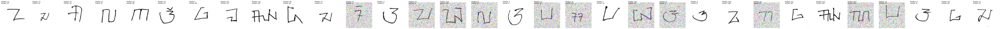

In [ ]:
# Predict with ResNet50 Model Arsitecture
img_path = '..//content/drive/MyDrive/TA/aksara_final/'

fig, ax = plt.subplots(nrows=1, ncols=32, figsize=(120,32))

for index, val in enumerate(random_value.values):
  img = load_img(img_path + val[2], target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  class_indices = new_train_generator.class_indices
  index_to_class = {v: k for k, v in class_indices.items()}

  # load the model
  resnet_prediction = resnet_model_fltn.predict(img_array)
  predicted_index = np.argmax(resnet_prediction)
  predicted_class = index_to_class[predicted_index]

  ax[index].imshow(img)
  ax[index].axis('off')
  ax[index].text(0.5, 0.1, "Actual: " + val[0], horizontalalignment='left', verticalalignment='top')
  ax[index].text(0.5, 0.1, "Predict: " + predicted_class, horizontalalignment='left', verticalalignment='bottom')
plt.show()

1/1 [==============================] - 0s 26ms/step


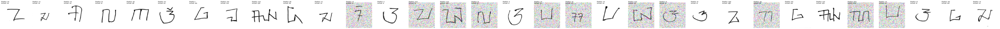

In [ ]:
# Predict with VGG19 Model Arsitecture
img_path = '..//content/drive/MyDrive/TA/aksara_final/'

fig, ax = plt.subplots(nrows=1, ncols=32, figsize=(120,32))

for index, val in enumerate(random_value.values):
  img = load_img(img_path + val[2], target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  class_indices = new_train_generator.class_indices
  index_to_class = {v: k for k, v in class_indices.items()}

  # load the model
  vgg19_prediction = vgg19_model_glbl.predict(img_array)
  predicted_index = np.argmax(vgg19_prediction)
  predicted_class = index_to_class[predicted_index]

  ax[index].imshow(img)
  ax[index].axis('off')
  ax[index].text(0.5, 0.1, "Actual: " + val[0], horizontalalignment='left', verticalalignment='top')
  ax[index].text(0.5, 0.1, "Predict: " + predicted_class, horizontalalignment='left', verticalalignment='bottom')
plt.show()

1/1 [==============================] - 0s 76ms/step


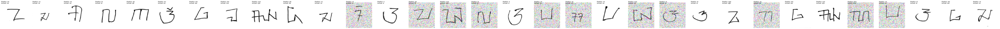

In [ ]:
# Predict with VGG19 Model Arsitecture
img_path = '..//content/drive/MyDrive/TA/aksara_final/'

fig, ax = plt.subplots(nrows=1, ncols=32, figsize=(120,32))

for index, val in enumerate(random_value.values):
  img = load_img(img_path + val[2], target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  class_indices = new_train_generator.class_indices
  index_to_class = {v: k for k, v in class_indices.items()}

  # load the model
  vgg19_prediction = vgg19_model_fltn.predict(img_array)
  predicted_index = np.argmax(vgg19_prediction)
  predicted_class = index_to_class[predicted_index]

  ax[index].imshow(img)
  ax[index].axis('off')
  ax[index].text(0.5, 0.1, "Actual: " + val[0], horizontalalignment='left', verticalalignment='top')
  ax[index].text(0.5, 0.1, "Predict: " + predicted_class, horizontalalignment='left', verticalalignment='bottom')
plt.show()

1/1 [==============================] - 0s 21ms/step


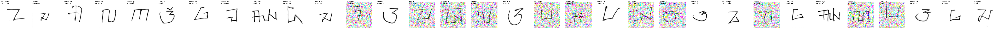

In [ ]:
# Predict with MobileNet Model Arsitecture
img_path = '..//content/drive/MyDrive/TA/aksara_final/'

fig, ax = plt.subplots(nrows=1, ncols=32, figsize=(120,32))

for index, val in enumerate(random_value.values):
  img = load_img(img_path + val[2], target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  class_indices = new_train_generator.class_indices
  index_to_class = {v: k for k, v in class_indices.items()}

  # load the model
  mobile_prediction =  mobile_model_glbl.predict(img_array)
  predicted_index = np.argmax(mobile_prediction)
  predicted_class = index_to_class[predicted_index]

  ax[index].imshow(img)
  ax[index].axis('off')
  ax[index].text(0.5, 0.1, "Actual: " + val[0], horizontalalignment='left', verticalalignment='top')
  ax[index].text(0.5, 0.1, "Predict: " + predicted_class, horizontalalignment='left', verticalalignment='bottom')
plt.show()

1/1 [==============================] - 0s 24ms/step


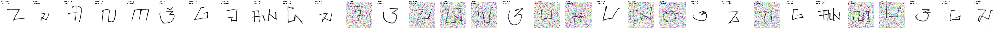

In [ ]:
# Predict with MobileNet Model Arsitecture
img_path = '..//content/drive/MyDrive/TA/aksara_final/'

fig, ax = plt.subplots(nrows=1, ncols=32, figsize=(120,32))

for index, val in enumerate(random_value.values):
  img = load_img(img_path + val[2], target_size=(224, 224))
  img_array = img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)

  class_indices = new_train_generator.class_indices
  index_to_class = {v: k for k, v in class_indices.items()}

  # load the model
  mobile_prediction =  mobile_model_fltn.predict(img_array)
  predicted_index = np.argmax(mobile_prediction)
  predicted_class = index_to_class[predicted_index]

  ax[index].imshow(img)
  ax[index].axis('off')
  ax[index].text(0.5, 0.1, "Actual: " + val[0], horizontalalignment='left', verticalalignment='top')
  ax[index].text(0.5, 0.1, "Predict: " + predicted_class, horizontalalignment='left', verticalalignment='bottom')
plt.show()

# Revisi

- tambahkan beberarapa data citra diluar dataset untuk diujikan ke dalam sistem dan analisis ✅
-Bagaiman jika model yang diterapkan tidak menggunakan Global average pooling✅
-Jumlah epoch ditambah ✅
-Analisis antara grafik accuracy dan model loss, khususnya saat terjadi perpotongan garis grafik antara training dan validation (misal epoch ke-3)✅
- Dataset terlalu sederhana perlu ditambah ✅

---

